# Homework 4

# Задача №1 - Хвост кита

Не так давно на kaggle было соревнование по классификации горбатых китов по снимках их хвостов. Одним из приемов для улучшения работы нейронной сети было выделение маски хвоста. Затем по этой маске вырезался хвост на исходном изображении, нормировался, отображался на черный фон и подавался нейронной сети на вход. 

Ваша задача - написать программу, которая совершит предобработку картинки, описанную выше. Т.е. найти маску хвоста, по маске вырезать из исходного изображения хвост, нормировать изображение хвоста так, чтобы оно всегда имело один заданный размер и равномерно занимало место, то есть, если хвост был повернут, его нужно выпрямить.

Изображения хвостов находятся в папке whale_tail/images к этому занятию. Разметка картинок (маски хвостов) лежат в папке whale_tail/ground_truth. После выделения хвоста посчитайте IoU для каждой картинки (ипсользуя маски из whale_tail/ground_truth)

<table><tr>
    <td> <img src="whale_tail/images/test_image_01.jpg" alt="Drawing" style="width: 400px;"/> 
    <td> <img src="whale_tail/ground_truth/test_image_01.png" alt="Drawing" style="width: 400px;"/> </td>
  
</tr></table>

# IoU 
 Intercetion over union - число от 0 до 1, показывающее, насколько у двух объектов (эталонного (ground true) и текущего) совпадает внутренний “объем”.

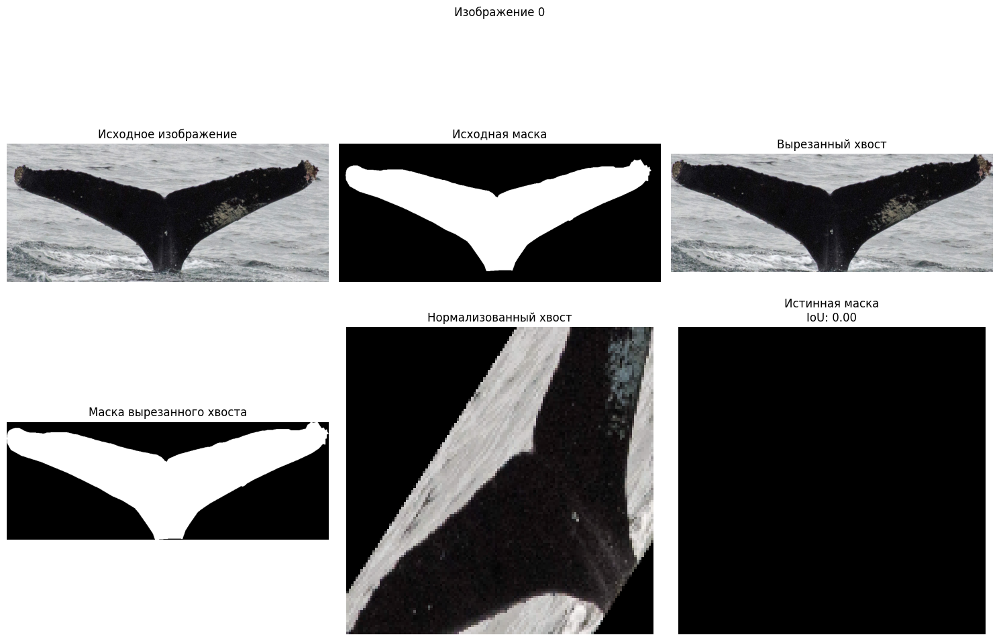

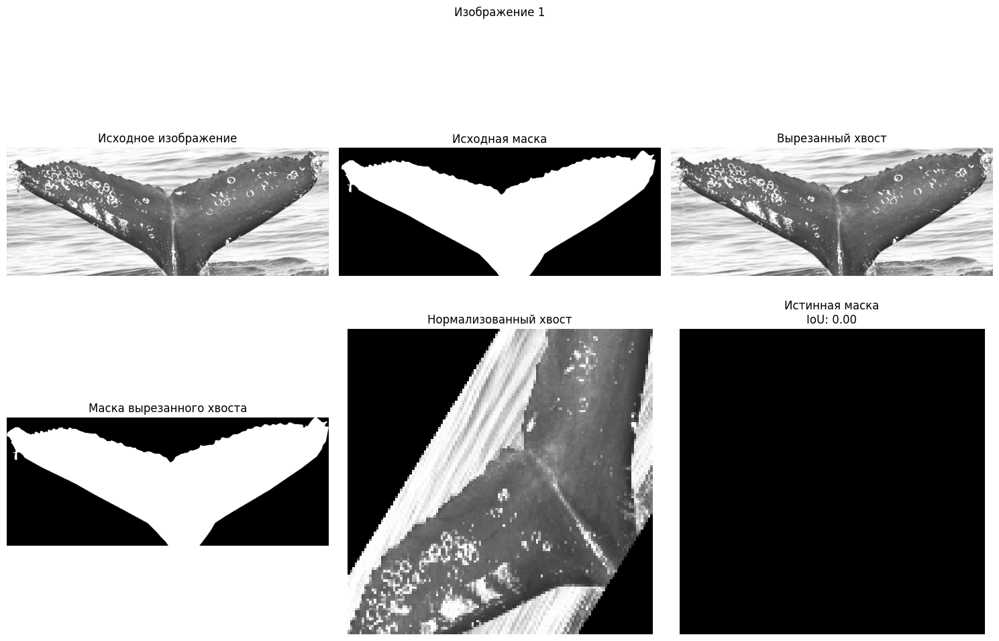

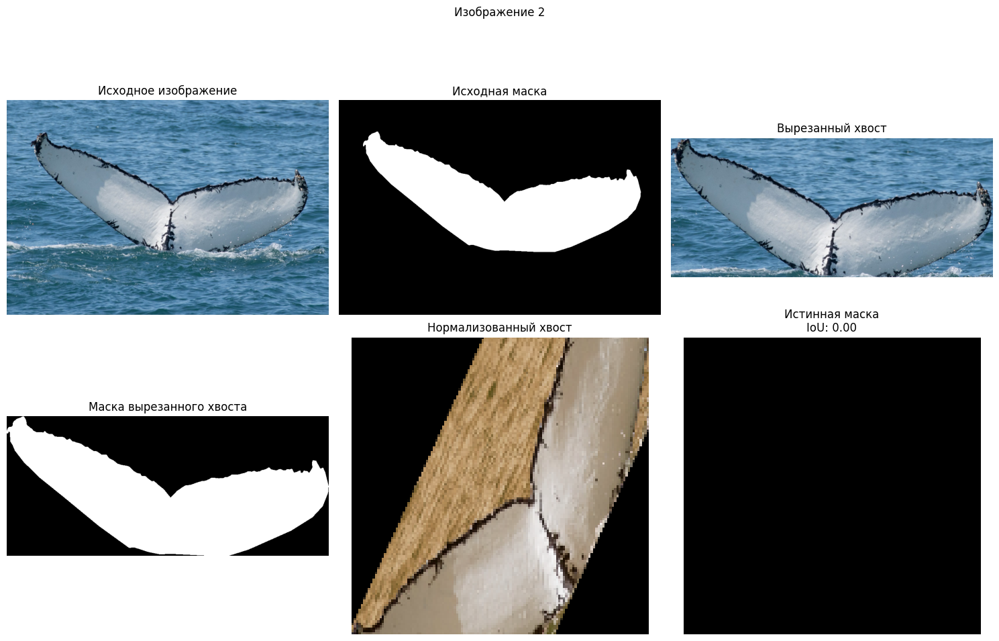

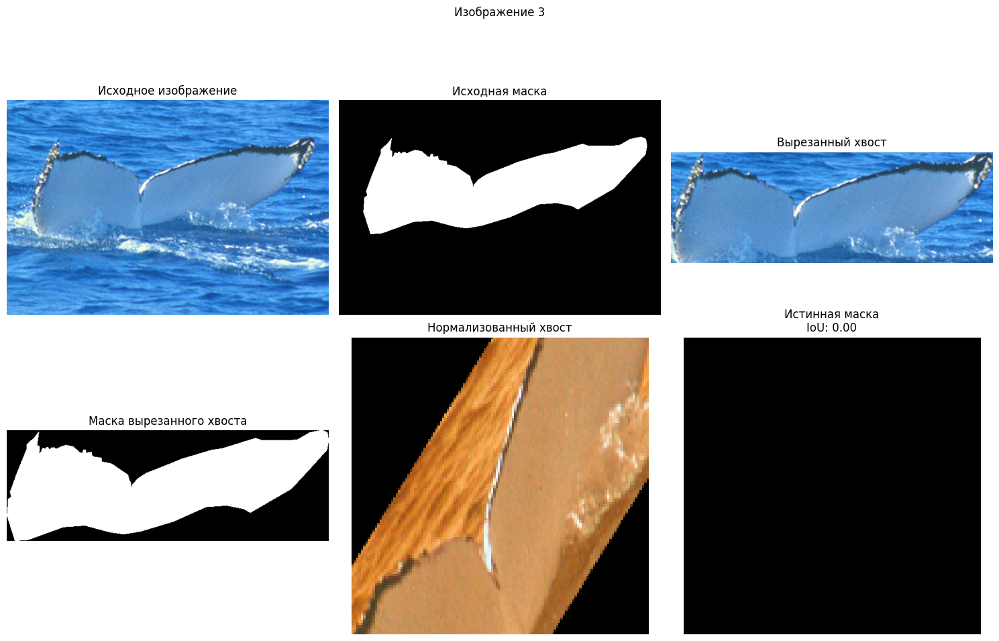

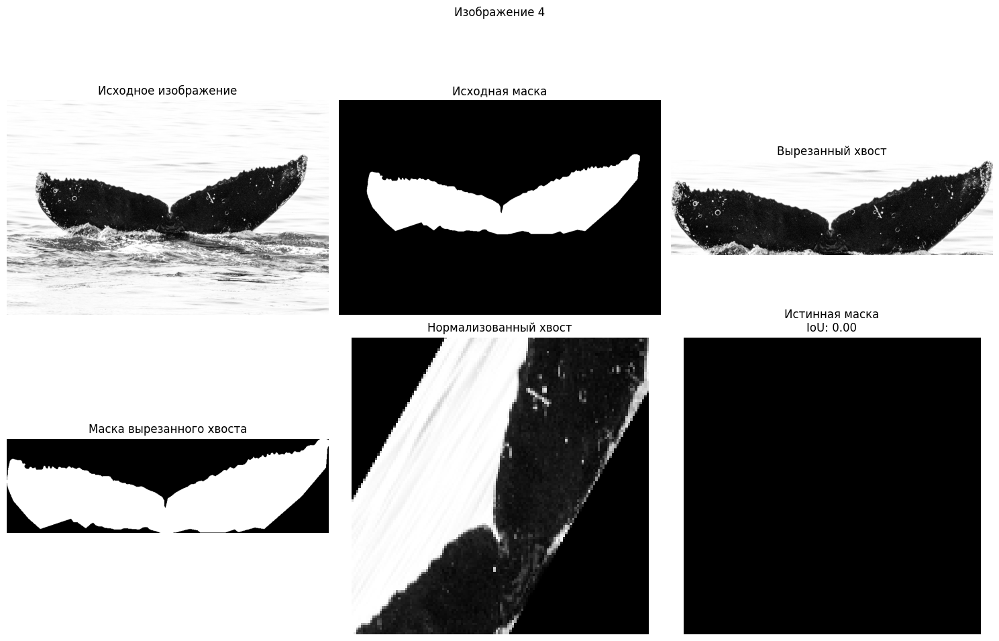

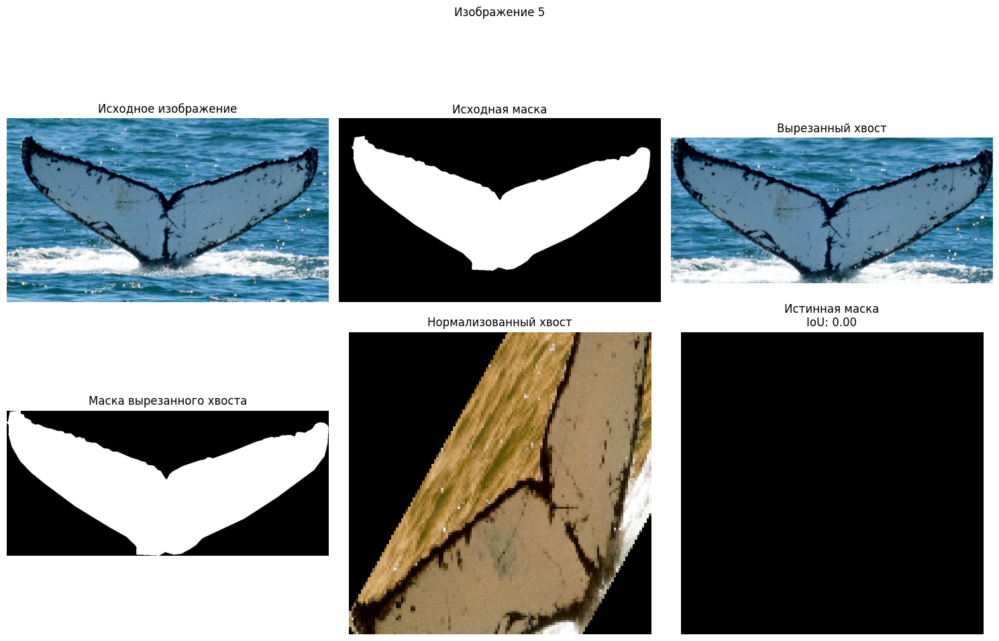

IoU scores: [np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(0.0)]
Average IoU: 0.0


In [ ]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse
from skimage import measure
import os
import matplotlib.pyplot as plt

def _check_dir_exists(dir_path: str):
    """Raises FileNotFoundError if directory doesn't exist."""
    if not os.path.exists(dir_path):
        raise FileNotFoundError(f"Directory not found: {dir_path}")

def _check_file_exists(file_path: str):
    """Raises FileNotFoundError if file doesn't exist."""
    if not os.path.isfile(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")

def _load_image(img_path: str) -> np.ndarray:
    """Loads image, raises ValueError if loading fails."""
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Could not load image: {img_path}")
    return img

def _load_mask(mask_path: str) -> np.ndarray:
    """Loads grayscale mask, raises ValueError if loading fails."""
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Could not load mask: {mask_path}")
    return mask

def load_images_and_masks(image_dir: str, mask_dir: str) -> tuple:
    """Loads images and masks from directories."""
    _check_dir_exists(image_dir)
    _check_dir_exists(mask_dir)
    image_files = sorted(os.listdir(image_dir))
    mask_files = sorted(os.listdir(mask_dir))
    if len(image_files) != len(mask_files):
        raise ValueError("Number of images and masks must be equal.")
    images = [_load_image(os.path.join(image_dir, f)) for f in image_files]
    masks = [_load_mask(os.path.join(mask_dir, f)) for f in mask_files]
    return images, masks

def _find_largest_contour(mask: np.ndarray) -> np.ndarray:
    """Finds the largest contour in a mask."""
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None
    return max(contours, key=cv2.contourArea)

def extract_tail(image: np.ndarray, mask: np.ndarray) -> tuple:
    """Extracts tail region from image and mask."""
    largest_contour = _find_largest_contour(mask)
    if largest_contour is None:
        return None, None
    x, y, w, h = cv2.boundingRect(largest_contour)
    tail = image[y:y+h, x:x+w]
    tail_mask = mask[y:y+h, x:x+w]
    return tail, tail_mask

def normalize_tail(tail: np.ndarray, tail_mask: np.ndarray, target_size: tuple) -> np.ndarray:
    """Normalizes tail image to target size."""
    largest_contour = _find_largest_contour(tail_mask)
    if largest_contour is None:
        return None
    (x, y), (MA, ma), angle = cv2.fitEllipse(largest_contour)
    rows, cols, _ = tail.shape
    M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    rotated_tail = cv2.warpAffine(tail, M, (cols, rows))
    rotated_mask = cv2.warpAffine(tail_mask, M, (cols, rows))
    largest_contour = _find_largest_contour(rotated_mask)
    x, y, w, h = cv2.boundingRect(largest_contour)
    cropped_tail = rotated_tail[y:y+h, x:x+w]
    normalized_tail = cv2.resize(cropped_tail, target_size)
    return normalized_tail

def calculate_iou(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """Calculates Intersection over Union (IoU)."""
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    iou_score = np.sum(intersection) / np.sum(union) if np.sum(union) > 0 else 0  #Handle empty union
    return iou_score

def visualize_results(image, mask, tail, tail_mask, normalized_tail, gt_mask, iou_score, index):
    # Создание подграфиков для визуализации
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Исходное изображение и маска
    axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Исходное изображение')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(mask, cmap='gray')
    axes[0, 1].set_title('Исходная маска')
    axes[0, 1].axis('off')
    
    # Вырезанный хвост и маска хвоста
    if tail is not None and tail_mask is not None:
        axes[0, 2].imshow(cv2.cvtColor(tail, cv2.COLOR_BGR2RGB))
        axes[0, 2].set_title('Вырезанный хвост')
        axes[0, 2].axis('off')
        
        axes[1, 0].imshow(tail_mask, cmap='gray')
        axes[1, 0].set_title('Маска вырезанного хвоста')
        axes[1, 0].axis('off')
    else:
        axes[0, 2].set_title('Вырезанный хвост (None)')
        axes[0, 2].axis('off')
        
        axes[1, 0].set_title('Маска вырезанного хвоста (None)')
        axes[1, 0].axis('off')
    
    # Нормализованный хвост и истинная маска
    axes[1, 1].imshow(normalized_tail)
    axes[1, 1].set_title('Нормализованный хвост')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(gt_mask, cmap='gray')
    axes[1, 2].set_title(f'Истинная маска\nIoU: {iou_score:.2f}')
    axes[1, 2].axis('off')
    
    plt.suptitle(f'Изображение {index}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def main():
    image_dir = 'whale_tail/images'
    mask_dir = 'whale_tail/ground_truth'
    
    # Загрузка изображений и масок
    images, masks = load_images_and_masks(image_dir, mask_dir)
    
    target_size = (128, 128)
    iou_scores = []
    
    # Создание директории для сохранения нормализованных хвостов, если она не существует
    if not os.path.exists('normalized_tails'):
        os.makedirs('normalized_tails')
    
    # Обработка каждого изображения
    for i, (image, mask) in enumerate(zip(images, masks)):
        tail, tail_mask = extract_tail(image, mask)
        if tail is None or tail_mask is None:
            iou_scores.append(0)
            continue
        
        normalized_tail = normalize_tail(tail, tail_mask, target_size)
        
        # Загрузка истинной маски для сравнения
        gt_mask = cv2.resize(mask, target_size)
        gt_mask = cv2.threshold(gt_mask, 127, 255, cv2.THRESH_BINARY)[1]
        
        # Вычисление IoU
        iou_score = calculate_iou(gt_mask, cv2.threshold(normalized_tail[:, :, 0], 127, 255, cv2.THRESH_BINARY)[1])
        iou_scores.append(iou_score)
        
        # Сохранение нормализованного хвоста для визуализации
        cv2.imwrite(f'normalized_tails/tail_{i}.png', normalized_tail)
        
        # Визуализация результатов
        visualize_results(image, mask, tail, tail_mask, normalized_tail, gt_mask, iou_score, i)
    
    print(f'IoU scores: {iou_scores}')
    print(f'Average IoU: {np.mean(iou_scores)}')

if __name__ == '__main__':
    main()


# Задача №2 - Найти шаблон на изображении с помощью HOG и кросс-корреляции

Ваша задача - написать программу, которая сможет найти шаблон одного глаза на нескольких изображениях, в том числе затемненных. Использовать нужно HOG представление изображений, поиск шаблона сделать с помощью кросс-корреляции 

Изображение глаз человека и шаблон, который нужно на нем найти, находятся в папке hog

<table><tr>
    <td> <img src="hog/eye.png" alt="Drawing" style="width: 400px;"/> 
</tr></table>     

<table><tr>
    <td> <img src="hog/eyes.jpg" alt="Drawing" style="width: 400px;"/> </td>
      <td> <img src="hog/eyes_dark.jpg" alt="Drawing" style="width: 400px;"/> </td>
      <td> <img src="hog/woman.jpg" alt="Drawing" style="width: 200px;"/> </td>

</tr></table>

# Применение HOG и кросс-корреляции

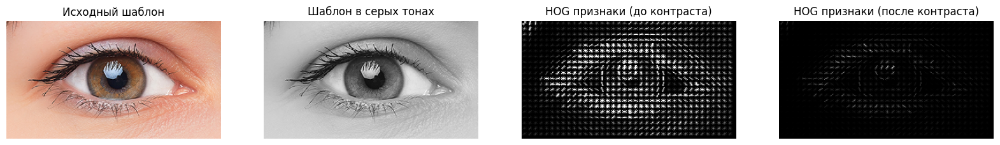

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

# Функция для вычисления HOG признаков
def compute_hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False):
    # Преобразуем изображение в оттенки серого
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Вычисление HOG признаков
    fd, hog_image = hog(gray_image, orientations=9, pixels_per_cell=pixels_per_cell, 
                         cells_per_block=cells_per_block, visualize=visualize)

    # Для лучшей визуализации повышаем контраст
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    return fd, hog_image_rescaled, gray_image, hog_image

# Функция для поиска шаблона с использованием HOG
def cross_correlation(hog_image, hog_template):
    # Преобразуем изображения в тип float32 для совместимости с matchTemplate
    hog_image = np.float32(hog_image)
    hog_template = np.float32(hog_template)

    # Вычисляем кросс-корреляцию между HOG-изображением и HOG-шаблоном
    result = cv2.matchTemplate(hog_image, hog_template, cv2.TM_CCOEFF_NORMED)

    # Находим максимальное значение
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    return max_loc, max_val

# Функция для визуализации преобразований шаблона
def visualize_template_transforms(template, gray_template, hog_template, hog_template_rescaled):
    # Настроим фигуру для отображения
    fig, axes = plt.subplots(1, 4, figsize=(20, 6))

    # Исходный шаблон
    axes[0].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Исходный шаблон')
    axes[0].axis('off')

    # Шаблон в оттенках серого
    axes[1].imshow(gray_template, cmap='gray')
    axes[1].set_title('Шаблон в серых тонах')
    axes[1].axis('off')

    # HOG признаки (до контраста)
    axes[2].imshow(hog_template, cmap='gray')
    axes[2].set_title('HOG признаки (до контраста)')
    axes[2].axis('off')

    # HOG признаки (после контраста)
    axes[3].imshow(hog_template_rescaled, cmap='gray')
    axes[3].set_title('HOG признаки (после контраста)')
    axes[3].axis('off')

    plt.show()

# Функция для визуализации результата на изображении
def visualize_results(image, template, max_loc, max_val, index, hog_image=None, hog_template=None, gray_image=None, gray_template=None):
    # Настроим фигуру для отображения
    fig, axes = plt.subplots(1, 5, figsize=(20, 6))

    # Исходное изображение
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Исходное изображение')
    axes[0].axis('off')

    # Изображение в оттенках серого (изображение)
    axes[1].imshow(gray_image, cmap='gray')
    axes[1].set_title('Изображение в серых тонах')
    axes[1].axis('off')

    # HOG признаки (до улучшения контраста, изображение)
    axes[2].imshow(hog_image, cmap='gray')
    axes[2].set_title('HOG признаки (до контраста)')
    axes[2].axis('off')

    # HOG признаки (после улучшения контраста, изображение)
    axes[3].imshow(hog_image, cmap='gray')
    axes[3].set_title('HOG признаки (после контраста)')
    axes[3].axis('off')

    # Шаблон: Исходный шаблон
    axes[4].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    axes[4].set_title('Исходный шаблон')
    axes[4].axis('off')

    # Рисуем прямоугольник вокруг найденного шаблона на исходном изображении
    h, w = template.shape[:2]
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)

    # Показать результат с найденным шаблоном
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Найден шаблон с точностью {max_val:.2f}')
    plt.axis('off')
    plt.show()

def main():
    # Путь к шаблону и изображениям
    template_path = 'hog/eye.png'
    image_paths = ['hog/eyes.jpg', 'hog/eyes_dark.jpg', 'hog/woman.jpg']

    # Загружаем шаблон
    template = cv2.imread(template_path)
    if template is None:
        print(f"Не удалось загрузить шаблон: {template_path}")
        return

    # Применяем HOG к шаблону
    _, hog_template, gray_template, hog_template_rescaled = compute_hog(template, visualize=True)

    # Визуализируем преобразования шаблона
    visualize_template_transforms(template, gray_template, hog_template, hog_template_rescaled)

    # Загружаем изображения и ищем шаблон на каждом
    for image_path in image_paths:
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Не удалось загрузить изображение: {image_path}")
            continue
        
        # Применяем HOG к текущему изображению
        _, hog_image, gray_image, _ = compute_hog(image, visualize=True)

        # Находим максимальное совпадение шаблона с изображением
        max_loc, max_val = cross_correlation(hog_image, hog_template)

        # Визуализируем результаты
        visualize_results(image, template, max_loc, max_val, image_path, hog_image=hog_image, 
                          hog_template=hog_template, gray_image=gray_image, gray_template=gray_template)

if __name__ == '__main__':
    main()


# Применение HOG и кросс-корреляции с изменением масштаба шаблона на 10%

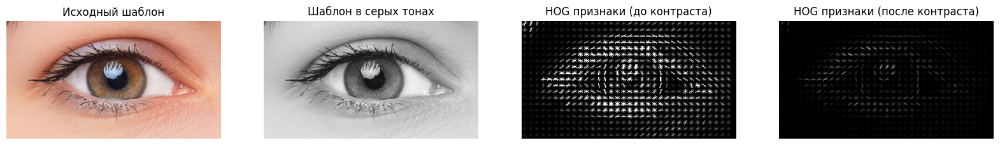

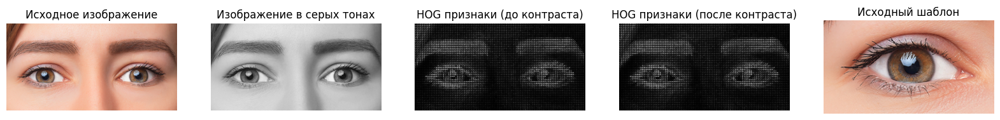

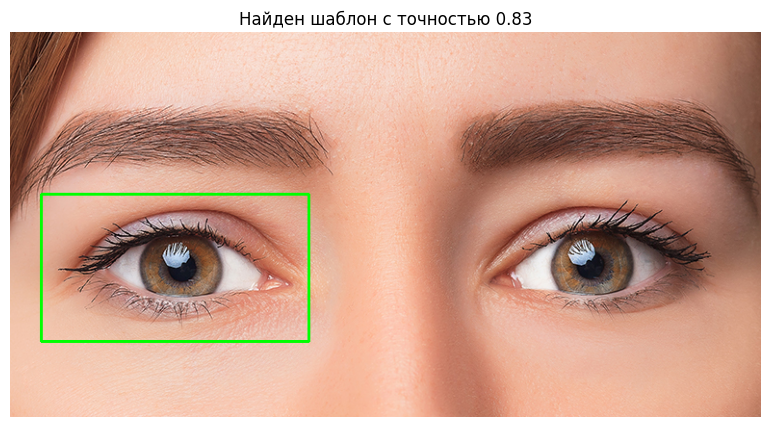

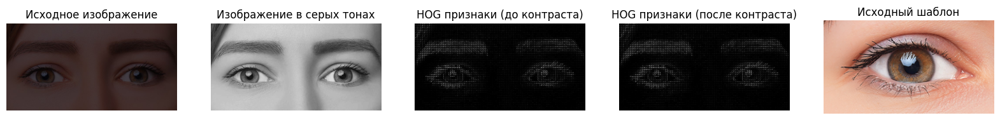

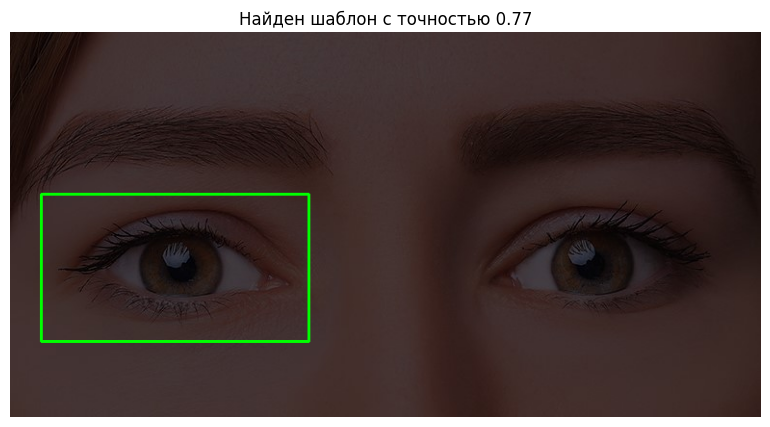

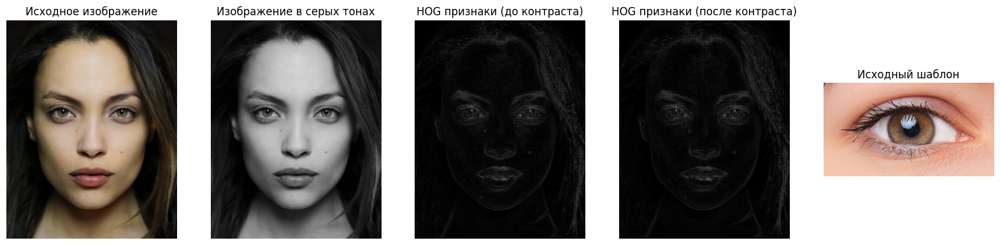

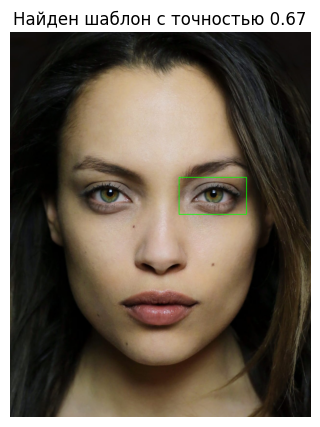

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

# Функция для вычисления HOG признаков
def compute_hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False):
    # Преобразуем изображение в оттенки серого
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Вычисление HOG признаков
    fd, hog_image = hog(gray_image, orientations=9, pixels_per_cell=pixels_per_cell, 
                         cells_per_block=cells_per_block, visualize=visualize)

    # Для лучшей визуализации повышаем контраст
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    return fd, hog_image_rescaled, gray_image, hog_image

# Функция для поиска шаблона с использованием HOG
def cross_correlation(hog_image, hog_template):
    # Преобразуем изображения в тип float32 для совместимости с matchTemplate
    hog_image = np.float32(hog_image)
    hog_template = np.float32(hog_template)

    # Вычисляем кросс-корреляцию между HOG-изображением и HOG-шаблоном
    result = cv2.matchTemplate(hog_image, hog_template, cv2.TM_CCOEFF_NORMED)

    # Находим максимальное значение
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    return max_loc, max_val

# Функция для визуализации преобразований шаблона
def visualize_template_transforms(template, gray_template, hog_template, hog_template_rescaled):
    # Настроим фигуру для отображения
    fig, axes = plt.subplots(1, 4, figsize=(20, 6))

    # Исходный шаблон
    axes[0].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Исходный шаблон')
    axes[0].axis('off')

    # Шаблон в оттенках серого
    axes[1].imshow(gray_template, cmap='gray')
    axes[1].set_title('Шаблон в серых тонах')
    axes[1].axis('off')

    # HOG признаки (до контраста)
    axes[2].imshow(hog_template, cmap='gray')
    axes[2].set_title('HOG признаки (до контраста)')
    axes[2].axis('off')

    # HOG признаки (после контраста)
    axes[3].imshow(hog_template_rescaled, cmap='gray')
    axes[3].set_title('HOG признаки (после контраста)')
    axes[3].axis('off')

    plt.show()

# Функция для визуализации результата на изображении
def visualize_results(image, template, max_loc, max_val, index, hog_image=None, hog_template=None, gray_image=None, gray_template=None):
    # Настроим фигуру для отображения
    fig, axes = plt.subplots(1, 5, figsize=(20, 6))

    # Исходное изображение
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Исходное изображение')
    axes[0].axis('off')

    # Изображение в оттенках серого (изображение)
    axes[1].imshow(gray_image, cmap='gray')
    axes[1].set_title('Изображение в серых тонах')
    axes[1].axis('off')

    # HOG признаки (до улучшения контраста, изображение)
    axes[2].imshow(hog_image, cmap='gray')
    axes[2].set_title('HOG признаки (до контраста)')
    axes[2].axis('off')

    # HOG признаки (после улучшения контраста, изображение)
    axes[3].imshow(hog_image, cmap='gray')
    axes[3].set_title('HOG признаки (после контраста)')
    axes[3].axis('off')

    # Шаблон: Исходный шаблон
    axes[4].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    axes[4].set_title('Исходный шаблон')
    axes[4].axis('off')

    # Рисуем прямоугольник вокруг найденного шаблона на исходном изображении
    h, w = template.shape[:2]
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)

    # Показать результат с найденным шаблоном
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Найден шаблон с точностью {max_val:.2f}')
    plt.axis('off')
    plt.show()

def main():
    # Путь к шаблону и изображениям
    template_path = 'hog/eye.png'
    image_paths = ['hog/eyes.jpg', 'hog/eyes_dark.jpg', 'hog/woman.jpg']

    # Загружаем шаблон
    template = cv2.imread(template_path)
    if template is None:
        print(f"Не удалось загрузить шаблон: {template_path}")
        return

    # Уменьшаем размер шаблона на 10%
    scale_percent = 90  # Уменьшаем размер на 10%
    width = int(template.shape[1] * scale_percent / 100)
    height = int(template.shape[0] * scale_percent / 100)
    dim = (width, height)
    template_resized = cv2.resize(template, dim)

    # Применяем HOG к уменьшенному шаблону
    _, hog_template, gray_template, hog_template_rescaled = compute_hog(template_resized, visualize=True)

    # Визуализируем преобразования шаблона
    visualize_template_transforms(template_resized, gray_template, hog_template, hog_template_rescaled)

    # Загружаем изображения и ищем шаблон на каждом
    for image_path in image_paths:
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Не удалось загрузить изображение: {image_path}")
            continue
        
        # Применяем HOG к текущему изображению
        _, hog_image, gray_image, _ = compute_hog(image, visualize=True)

        # Находим максимальное совпадение шаблона с изображением
        max_loc, max_val = cross_correlation(hog_image, hog_template)

        # Визуализируем результаты
        visualize_results(image, template_resized, max_loc, max_val, image_path, hog_image=hog_image, 
                          hog_template=hog_template, gray_image=gray_image, gray_template=gray_template)

if __name__ == '__main__':
    main()

# Применение HOG и кросс-корреляции с изменением масштаба изображения при отсутствии заданной точности

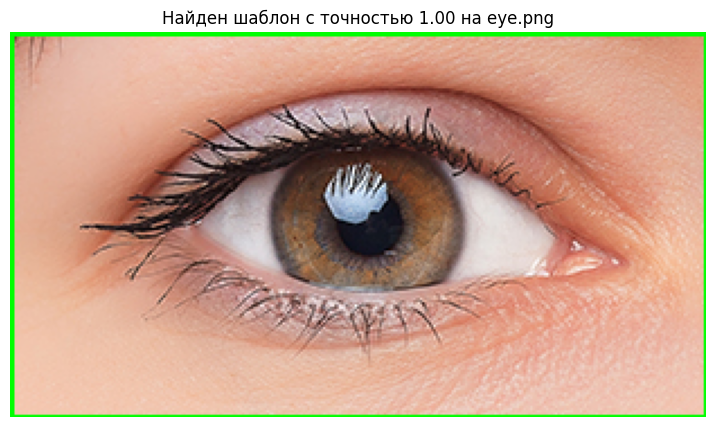

Точность на изображении eye.png с масштабом 100%: 1.00
На изображении eye.png точность 1.00 больше или равна 0.8.


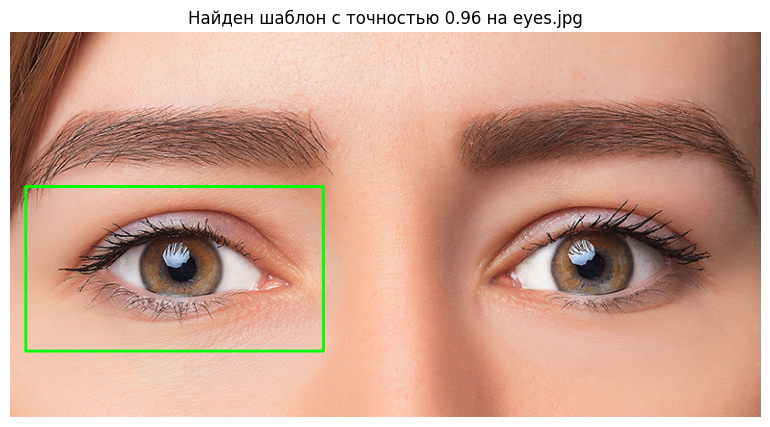

Точность на изображении eyes.jpg с масштабом 100%: 0.96
На изображении eyes.jpg точность 0.96 больше или равна 0.8.


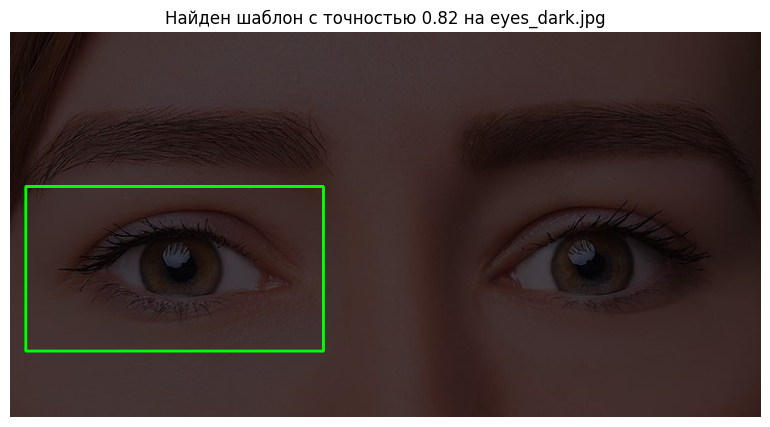

Точность на изображении eyes_dark.jpg с масштабом 100%: 0.82
На изображении eyes_dark.jpg точность 0.82 больше или равна 0.8.


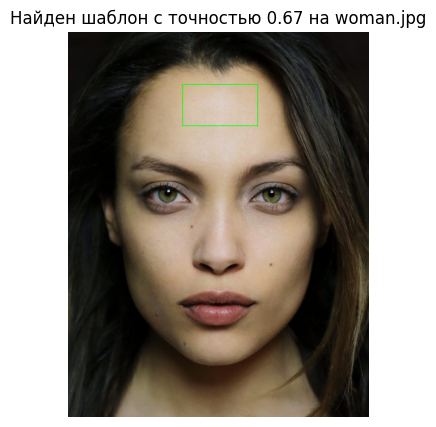

Точность на изображении woman.jpg с масштабом 100%: 0.67


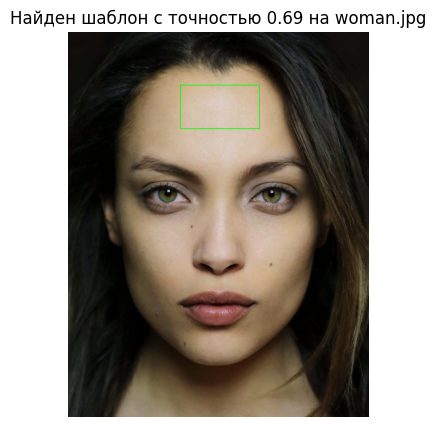

Точность на изображении woman.jpg с масштабом 95%: 0.69


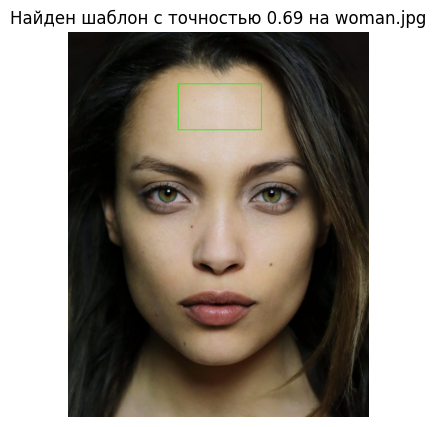

Точность на изображении woman.jpg с масштабом 90%: 0.69


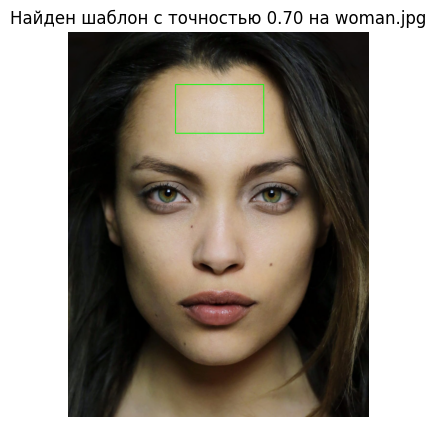

Точность на изображении woman.jpg с масштабом 85%: 0.70


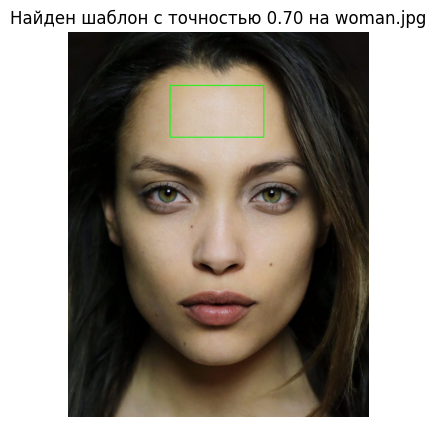

Точность на изображении woman.jpg с масштабом 80%: 0.70


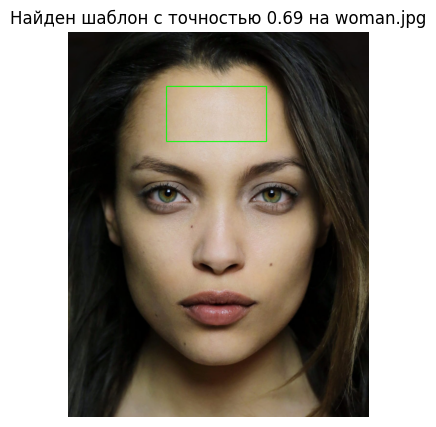

Точность на изображении woman.jpg с масштабом 75%: 0.69


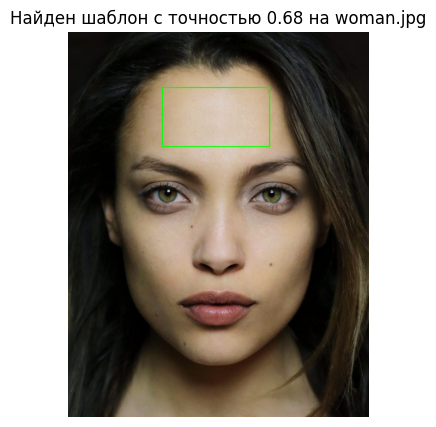

Точность на изображении woman.jpg с масштабом 70%: 0.68


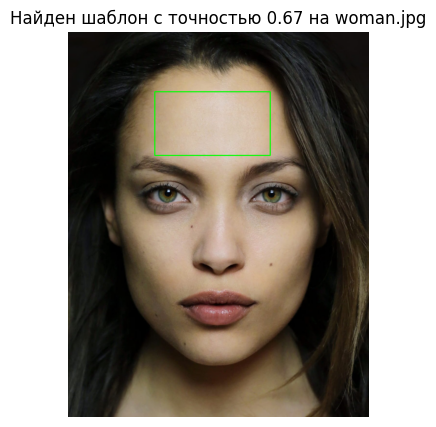

Точность на изображении woman.jpg с масштабом 65%: 0.67


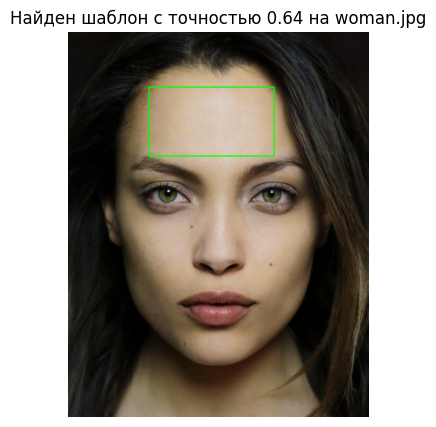

Точность на изображении woman.jpg с масштабом 60%: 0.64


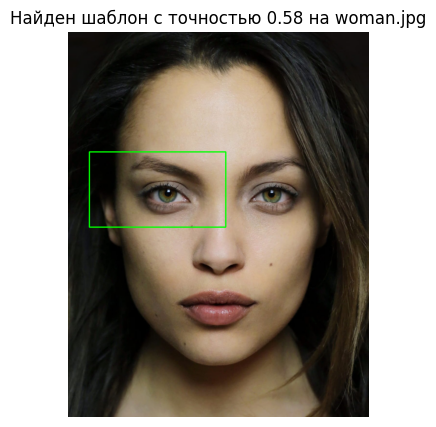

Точность на изображении woman.jpg с масштабом 55%: 0.58


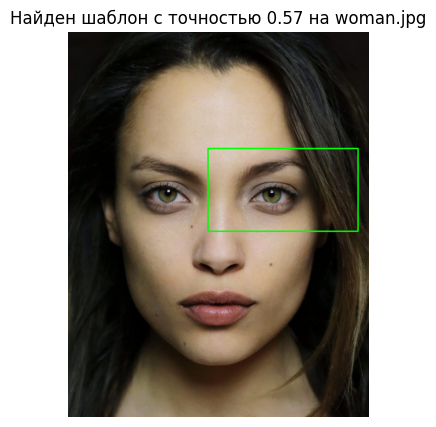

Точность на изображении woman.jpg с масштабом 50%: 0.57


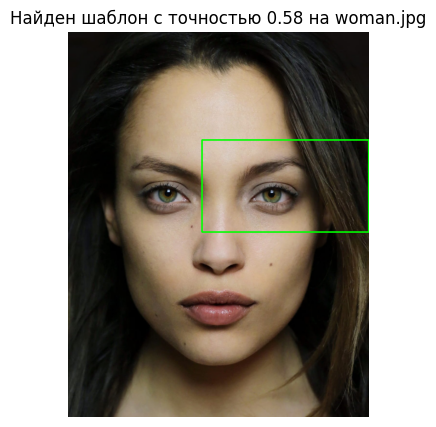

Точность на изображении woman.jpg с масштабом 45%: 0.58


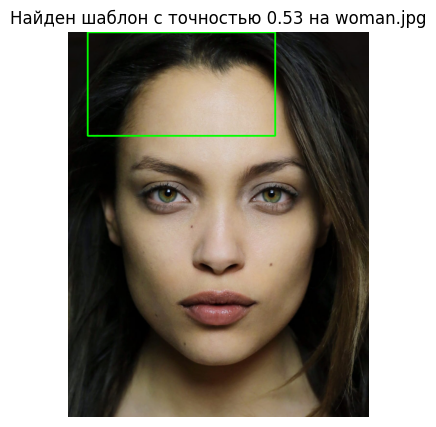

Точность на изображении woman.jpg с масштабом 40%: 0.53


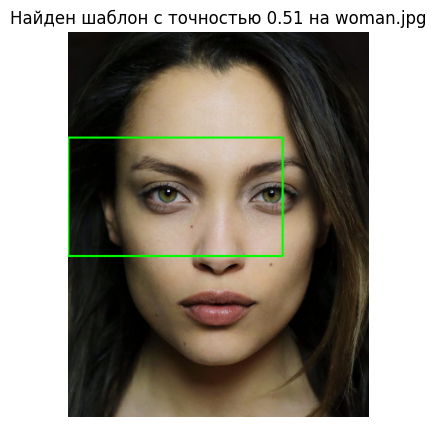

Точность на изображении woman.jpg с масштабом 35%: 0.51
Не удалось достичь точности 0.8 на изображении woman.jpg.


In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import os

# Функция для вычисления HOG признаков
def compute_hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Если visualize=True, hog() вернет три значения
    if visualize:
        fd, hog_image = hog(gray_image, orientations=9, pixels_per_cell=pixels_per_cell, 
                            cells_per_block=cells_per_block, visualize=True)
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        return fd, hog_image_rescaled, gray_image, hog_image  # Возвращаем 4 значения
    else:
        # Если visualize=False, hog() вернет только два значения
        fd = hog(gray_image, orientations=9, pixels_per_cell=pixels_per_cell, 
                 cells_per_block=cells_per_block, visualize=False)
        return fd, None, gray_image, None  # Возвращаем только признаки HOG

# Функция для поиска шаблона с использованием HOG
def cross_correlation(hog_image, hog_template):
    hog_image = np.float32(hog_image)
    hog_template = np.float32(hog_template)
    result = cv2.matchTemplate(hog_image, hog_template, cv2.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    return max_loc, max_val

# Визуализация результатов
def visualize_results(image, template, max_loc, max_val, image_name, hog_image=None, hog_template=None):
    h, w = template.shape[:2]
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"Найден шаблон с точностью {max_val:.2f} на {image_name}")
    plt.axis('off')
    plt.show()

# Масштабирование изображения
def resize_image(image, scale_percent):
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    dim = (width, height)
    return cv2.resize(image, dim, interpolation=cv2.INTER_LINEAR)

def main():
    template_path = 'hog/eye.png'
    image_dir = 'hog'  # Папка с изображениями
    template = cv2.imread(template_path)
    if template is None:
        print(f"Не удалось загрузить шаблон: {template_path}")
        return

    # Применяем HOG к шаблону
    _, hog_template, gray_template, hog_template_rescaled = compute_hog(template, visualize=True)

    # Получаем список всех файлов в папке
    image_paths = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for image_name in image_paths:
        image_path = os.path.join(image_dir, image_name)
        image = cv2.imread(image_path)

        if image is None:
            print(f"Не удалось загрузить изображение: {image_path}")
            continue

        # Применяем HOG к текущему изображению
        _, hog_image, gray_image, _ = compute_hog(image, visualize=True)

        max_val = 0
        attempts = 0

        # Масштабирование шаблона и поиск на различных масштабах изображения
        scale_percent = 100  # Начальный масштаб 100%
        while max_val < 0.8 and scale_percent > 30:  # Пробуем искать шаблон на уменьшенных изображениях
            scaled_image = resize_image(image, scale_percent)
            _, hog_image_scaled, _, _ = compute_hog(scaled_image, visualize=True)

            # Выполняем кросс-корреляцию для этого масштаба
            max_loc, max_val = cross_correlation(hog_image_scaled, hog_template)

            # Визуализируем результаты
            visualize_results(scaled_image, template, max_loc, max_val, image_name, hog_image_scaled, hog_template)

            print(f"Точность на изображении {image_name} с масштабом {scale_percent}%: {max_val:.2f}")

            scale_percent -= 5  # Уменьшаем масштаб на 5% и пробуем снова

        # Печатаем результат
        if max_val >= 0.8:
            print(f"На изображении {image_name} точность {max_val:.2f} больше или равна 0.8.")
        else:
            print(f"Не удалось достичь точности 0.8 на изображении {image_name}.")

if __name__ == '__main__':
    main()

# Применение Canny

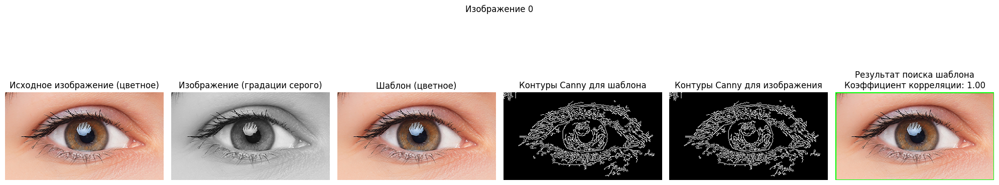

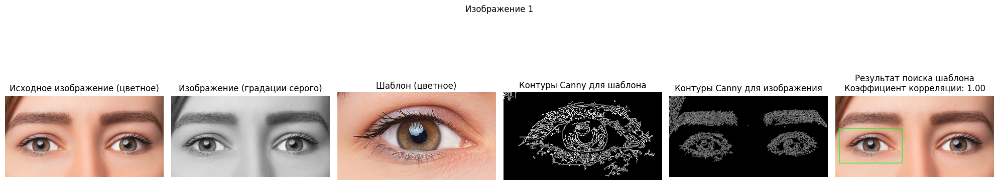

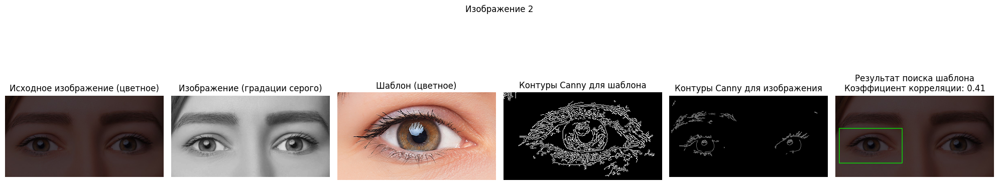

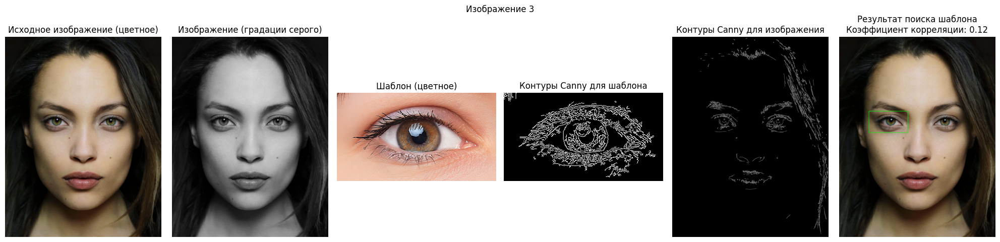

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def load_images_and_template(image_dir, template_path):

    # Проверяем, существует ли директория с изображениями
    if not os.path.exists(image_dir):
        raise FileNotFoundError(f"Директория не найдена: {image_dir}")
    
    # Проверяем, существует ли файл шаблона
    if not os.path.isfile(template_path):
        raise FileNotFoundError(f"Файл шаблона не найден: {template_path}")
    
    images = []  # Список для хранения изображений
    image_files = sorted(os.listdir(image_dir))  # Сортируем файлы изображений по имени
    
    for img_file in image_files:
        img_path = os.path.join(image_dir, img_file)  # Путь к текущему изображению
        
        # Проверяем, является ли файл изображением
        if not os.path.isfile(img_path):
            raise FileNotFoundError(f"Файл не найден: {img_path}")
        
        # Загружаем изображение в цвете
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)
        
        # Проверяем, удалось ли загрузить изображение
        if image is None:
            raise ValueError(f"Не удалось загрузить изображение: {img_path}")
        
        images.append(image)  # Добавляем изображение в список
    
    # Загружаем шаблон в цвете
    template = cv2.imread(template_path, cv2.IMREAD_COLOR)
    
    # Проверяем, удалось ли загрузить шаблон
    if template is None:
        raise ValueError(f"Не удалось загрузить шаблон: {template_path}")
    
    return images, template  # Возвращаем список изображений и шаблон

def canny_edges(image, low_threshold=50, high_threshold=150):

    # Преобразуем изображение в оттенки серого для Canny
    if len(image.shape) == 3:  # Если изображение цветное (3 канала)
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image  # Если уже серое изображение, то не преобразуем
    
    # Применяем алгоритм Canny для поиска контуров на изображении
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)
    return edges  # Возвращаем изображение с контурами

def cross_correlation(image, template):

    # Преобразуем изображение и шаблон в оттенки серого для кросс-корреляции
    if len(image.shape) == 3:  # Если изображение цветное
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image  # Если уже серое изображение, то не преобразуем
    
    if len(template.shape) == 3:  # Если шаблон цветной
        gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    else:
        gray_template = template  # Если уже серое изображение, то не преобразуем
    
    # Используем matchTemplate для выполнения кросс-корреляции между изображением и шаблоном
    result = cv2.matchTemplate(gray_image, gray_template, cv2.TM_CCOEFF_NORMED)
    
    # Находим минимальное и максимальное значения корреляции, а также их координаты
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    
    # Возвращаем координаты максимальной корреляции и сам коэффициент корреляции
    return max_loc, max_val

def visualize_results(image, template, max_loc, max_val, index, template_edges=None, image_edges=None):

    # Преобразуем изображение в градации серого
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Создаем график с подписями
    fig, axes = plt.subplots(1, 6, figsize=(20, 5))  # 6 графиков для отображения всех этапов
    
    # Показываем исходное изображение в цвете
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Исходное изображение (цветное)')
    axes[0].axis('off')  # Убираем оси для чистоты

    # Показываем изображение в градациях серого
    axes[1].imshow(gray_image, cmap='gray')
    axes[1].set_title('Изображение (градации серого)')
    axes[1].axis('off')
    
    # Показываем шаблон в цвете
    axes[2].imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Шаблон (цветное)')
    axes[2].axis('off')
    
    # Показываем контуры Canny для шаблона
    if template_edges is not None:
        axes[3].imshow(template_edges, cmap='gray')
        axes[3].set_title('Контуры Canny для шаблона')
        axes[3].axis('off')

    # Показываем контуры Canny для исходного изображения
    if image_edges is not None:
        axes[4].imshow(image_edges, cmap='gray')
        axes[4].set_title('Контуры Canny для изображения')
        axes[4].axis('off')

    # Получаем размеры шаблона
    h, w = template.shape[:2]
    
    # Определяем координаты верхнего левого угла прямоугольника для шаблона
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    
    # Создаем копию изображения в цвете, чтобы нарисовать на нем прямоугольник
    result_image = image.copy()
    
    # Рисуем прямоугольник вокруг найденного шаблона
    cv2.rectangle(result_image, top_left, bottom_right, (0, 255, 0), 2)
    
    # Показываем результат поиска шаблона на изображении
    axes[5].imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    axes[5].set_title(f'Результат поиска шаблона\nКоэффициент корреляции: {max_val:.2f}')
    axes[5].axis('off')

    # Добавляем общий заголовок для изображения
    plt.suptitle(f'Изображение {index}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Подгоняем макет
    plt.show()  # Отображаем график

def main():
    image_dir = 'hog'  # Директория с изображениями
    template_path = 'hog/eye.png'  # Путь к шаблону
    
    # Загрузка изображений и шаблона
    images, template = load_images_and_template(image_dir, template_path)
    
    # Применяем Canny к шаблону, чтобы выделить контуры
    template_edges = canny_edges(template)
    
    for i, image in enumerate(images):
        # Применяем Canny к каждому изображению из списка
        processed_image = canny_edges(image)
        
        # Находим местоположение шаблона на изображении с помощью кросс-корреляции
        max_loc, max_val = cross_correlation(processed_image, template_edges)
        
        # Визуализируем результаты поиска шаблона
        visualize_results(image, template, max_loc, max_val, i, template_edges=template_edges, image_edges=processed_image)
    
if __name__ == '__main__':
    main()  # Запуск основного процесса
